# Table of Contents 
## 1. General 
    a. Cleversys_parser function *
    b. Standard_analysis: Parses your files *+
    c. Review your dataframe
    d. Edit your dataframe +
## 2. Functions
    a. Graphs all data and group means for each measure*
    b. Repeated measures ANOVA across timepoints*
    c. One-way ANOVA between treatment groups*
    d. two-way ANOVA for treatment groups ad timepoints*
## 3. Running each functions (Run the ones you need)
    a. Graphs all data and group means for each measure
    b. Repeated measures ANOVA across timepoints
    c. One-way ANOVA between treatment groups
    d. Two-way ANOVA for treatment groups and timepoints

Run this cell *
Cell requires user input +

1. a) Run Cleversys_parser code written by dave which initializes some key functions

In [78]:
import numpy as np
import pandas as pd
import io as io
import re
import math
import seaborn as sns
import os

version = '1.0'

def parse(file):
    '''parse a file and return a dataframe and the animal ID'''
    with open(file) as f:

        #find the format string
        found = False
        frame_rate = None
        skip = 1

        #edit these if you want to change what rules are recoreded
        event_rules = {'Social Contact [ 1 with 2 ] in Area left':'huddle_left',
                        'Social Contact [ 1 with 3 ] in Area right ':'huddle_right',
                        'Distance between [ 1 and 2 ] Less Than 100.00 mm': 'proximity_left',
                        'Distance between [ 1 and 3 ] Less Than 100.00 mm':'proximity_right',
                        '1 Stay/Hide In left':'left_chamber',
                        '1 Stay/Hide In right':'right_chamber',
                        '1 Stay/Hide In center':'center_chamber'}


        #a dictionary where we can put our found event rule names for later
        found_rules = {event_rules[key]:None for key in event_rules.keys()}

        while not found:
            skip +=1

            line = f.readline()

            if 'Frame Rate' in line:
                frame_rate = float(line.split(':')[1])
            #format line begins with 'Format:'
            if 'Format:' in line:
                found = True

                #raw column names. we'll get back to these, and rename them to make them more informative
                #also need to cleanup some of the cleversys output, because of course
                col_names_r = line.strip().replace('Motion\tOrientation(-pi/2 to pi/2)', 'Motion Orientation(-pi/2 to pi.2)\tUnknown').split('\t')
                col_names_r[0] = 'FrameNum'

            #find which side the partner is on. Animal 2 is always on the left
            if 'animal id' in line.lower():
                newline = f.readline()
                animal_ID = newline.split("\t")[line.lower().split('\t').index('animal id')]
                partner_pos = newline.split("\t")[line.lower().split('\t').index('side of partner')]

                treatment_idx = [i for i, s in enumerate(line.lower().split('\t')) if 'treatment' in s]
                if len(treatment_idx)>1:
                    print('too many matches for treatment in metadata')
                else:
                    treatment_group = newline.split("\t")[treatment_idx[0]]

                raw_date = newline.split("\t")[line.lower().split('\t').index('last modified date')]

                #replace '/' with '_', then split date from the time and use that
                date = raw_date.replace('/','_').split(' ')[0]

                #figure out who is where
                if partner_pos.lower() == 'l' or partner_pos.lower() == 'left':
                    'Partner on left, animal_2 = partner'
                    animal_2 = 'partner'
                    animal_3 = 'novel'
                else:
                    'Partner on right, animal_3 = partner'
                    animal_2 = 'novel'
                    animal_3 = 'partner'

            #get the event rule number corresponding to huddling with partner or novel
            #the line looks like:
            # EventRule17: Social Contact [ 1 with 2 ] in Area left while Joint Motion < 0.040
            # so splitting on ':' and taking the first element will give the eventrule name
            #corrseponding to the metric

            #also grab the event rule name for some other key metrics,
            #like vole location, and vole within 100 mm.

            #acheive by iterating over dict


            for key in event_rules.keys():
                if key.lower() in line.lower():
                    found_rules[event_rules[key]] = line.split(':')[0]
                    break

            '''if 'Social Contact [ 1 with 2 ] in Area left'.lower() in line.lower():
                huddle_left = line.split(':')[0]

            if 'Social Contact [ 1 with 3 ] in Area right '.lower() in line.lower():
                huddle_right = line.split(':')[0]

            if 'Distance between [ 1 and 2 ] Less Than 100.00 mm'.lower() in line.lower():
                proximity_left = line.split(':')[0]

            if 'Distance between [ 1 and 3 ] Less Than 100.00 mm'.lower() in line.lower():
                proximity_right = line.split(':')[0]

            if 'Area:Vole 1 Stay/Hide In left'.lower() in line.lower():
                left_chamber = line.split(":")[0]

            if 'Area:Vole 1 Stay/Hide In right'.lower() in line.lower():
                right_chamber = line.split(":")[0]

            if 'Area:Vole 1 Stay/Hide In center'.lower() in line.lower():
                center_chamber = line.split(":")[0]'''
    for k in found_rules.keys():
        if not found_rules[k]:
            print(f'couldnt find a line containing "{k}" in the file head. double check the file.')
    #READ IN WITH PANDAS
    df = pd.read_table(file, skiprows = skip, header = None)

    #get rid of weird empty columns
    df.dropna(how = 'all', axis =  'columns', inplace = True)

    #rename columns with informative names, like "CenterX(mm)_partner". start
    #with an empty array that we will add col names to
    new_col = []

    #when we iterate over the column names we're essentially going "left to right",
    #so test animal --> animal_2 --> animal_3. We've already assigned the identity
    # (novel or partner) to animal_2 and animal_3, so we can use those variables
    #when redefining our column names
    for n in col_names_r:

        #if the column not yet in the col name list, add it.
        #first pass is for the test animal
        if not n in new_col:
            new_col.append(n)

        #if the col name plus animal_2 is there, add name plus animal_3
        elif n+'_'+animal_2 in new_col:
            new_col.append(n+'_'+animal_3)

        #otherwise, we're currently iterating over animal_2's columns.
        else:
            new_col.append(n+'_'+animal_2)

    #re-assign column names to the new column names.
    df.columns = new_col



    #we will replace uncertain rows with np.nan, but leave the frame number information.
    #these list comprehensions assemble lists of columns specific to test, novel,
    #and partner animals to set to np.nan, while leaving event rules alone.
    #We will leave the event rules UNCHANGED so that if cleversys thinks the animals are huddling
    #that will still be captured.
    take_me = [col for col in df.columns if 'Frame' not in col if 'Event' not in col if 'partner' not in col if 'novel' not in col]
    take_me_n =[col for col in df.columns if 'novel' in col]
    take_me_p = [col for col in df.columns if 'partner' in col]

    #use np.nan to remove data from times when animal pos is uncertain.
    #Cleversys sets CenterX(mm) and CenterY(mm) to -1 in these cases. We can
    #look at each animal seperately, so even if one animal is uncertain, the
    # others are available.
    df.loc[df['CenterX(mm)'] == -1, take_me] = np.nan
    df.loc[df['CenterX(mm)_novel'] == -1, take_me_n] = np.nan
    df.loc[df['CenterX(mm)_partner'] == -1, take_me_p] = np.nan


    #the following renames key Event Rule columns. Note that this must occur after
    #the above removal of bad values, or else columns without "Event" will also
    #be overriden.

    if partner_pos.lower() == 'l' or partner_pos.lower() == 'left':

        df.rename(columns={found_rules['huddle_left']:'huddle_partner',
        found_rules['huddle_right']:'huddle_novel', found_rules['proximity_left']:'partner_dist_less_10cm',
        found_rules['proximity_right']:'novel_dist_less_10cm',found_rules['left_chamber']:'chamber_partner',
        found_rules['right_chamber']:'chamber_novel',found_rules['center_chamber']:'chamber_center'}, inplace = True)

    else:

        df.rename(columns={found_rules['huddle_right']:'huddle_partner',
        found_rules['huddle_left']:'huddle_novel', found_rules['proximity_right']:'partner_dist_less_10cm',
        found_rules['proximity_left']:'novel_dist_less_10cm', found_rules['right_chamber']:'chamber_partner',
        found_rules['left_chamber']:'chamber_novel',found_rules['center_chamber']:'chamber_center'}, inplace = True)

    #reset frames so they start at 1
    df['FrameNum'] = df['FrameNum'] - df['FrameNum'].min() + 1

    #calculate time from frame num ( frame * 1 / (frame / sec)  --> sec )
    df['Time'] = df.FrameNum/frame_rate

    #add column of treatment group (IE Naive, Drug, etc)
    df['Treatment Group'] = treatment_group

    #reset the useless AnimalID column (cleversys sets it always to 1) to the number for the test vole
    df['[AnimalID]'] = animal_ID


    # np.linalg.norm can be used to calculate the distance between points
    # https://stackoverflow.com/questions/1401712/how-can-the-euclidean-distance-be-calculated-with-numpy/21986532
    # basically just a really fast way to take advantage of np to do:

    # sqrt((xt - xo)^2 + (yt - yo)^2)

    # where t is test and o is other animal

    df['distance_to_partner'] = np.linalg.norm((df['CenterY(mm)'] - df['CenterY(mm)_partner'],
                                df['CenterX(mm)'] - df['CenterX(mm)_partner']), axis = 0)

    df['distance_to_novel'] = np.linalg.norm((df['CenterY(mm)'] - df['CenterY(mm)_novel'],
                                df['CenterX(mm)'] - df['CenterX(mm)_novel']), axis = 0)

    # calculate distance traveled since last frame. First frame distance is
    #set to zero

    #make two offset arrays so we can simply subtract the finishX array
    #from the startX array, rather than going elementwise
    startX = df['CenterX(mm)'][:-1].values
    finishX = df['CenterX(mm)'][1:].values

    startY = df['CenterY(mm)'][:-1].values
    finishY = df['CenterY(mm)'][1:].values

    #use same strategy as distance_to_partner to calculate euclidean distance
    dist_traveled = np.linalg.norm((startX-finishX, startY-finishY), axis = 0)
    #add on a zero to the start of the array for frame 1
    dist_traveled = np.append(np.asarray([0]), dist_traveled)

    startX_partner = df['CenterX(mm)_partner'][:-1].values
    finishX_partner = df['CenterX(mm)_partner'][1:].values

    startY_partner = df['CenterY(mm)_partner'][:-1].values
    finishY_partner = df['CenterY(mm)_partner'][1:].values

    #use same strategy as distance_to_partner to calculate euclidean distance
    dist_traveled_partner = np.linalg.norm((startX_partner-finishX_partner, startY-finishY_partner), axis = 0)
    #add on a zero to the start of the array for frame 1
    dist_traveled_partner = np.append(np.asarray([0]), dist_traveled_partner)

    startX_novel = df['CenterX(mm)_novel'][:-1].values
    finishX_novel= df['CenterX(mm)_novel'][1:].values

    startY_novel = df['CenterY(mm)_novel'][:-1].values
    finishY_novel = df['CenterY(mm)_novel'][1:].values

    #use same strategy as distance_to_partner to calculate euclidean distance
    dist_traveled_novel = np.linalg.norm((startX_novel-finishX_novel, startY_novel-finishY_novel), axis = 0)
    #add on a zero to the start of the array for frame 1
    dist_traveled_novel = np.append(np.asarray([0]), dist_traveled_novel)

    df['distance_traveled'] = dist_traveled
    df['distance_traveled_partner'] = dist_traveled_partner
    df['distance_traveled_novel'] = dist_traveled_novel

    return df, animal_ID, frame_rate, date


def assemble_names(directory):
    '''return a list of paths to files to parse'''
    os.chdir(directory)

    #create an empty 2d list
    out_names = []

    #this will assemble a list of ALL filenames for images, sorted by timestamp of acquisition


    for root, dirs, files in os.walk(directory):
        out = [os.path.join(root, f) for f in sorted(files) if
            f.endswith('TCR.TXT') if not f.startswith('.')]
        out_names += out
    return out_names

def parse_and_convert_csv(file, out_file):
    '''parse a file aaaannnnndd output a csv file'''
    df, ani, frame_rate, date = parse(file)
    df.to_csv(out_file)
    return df, ani, frame_rate, date




1. b) Add name of folder(s) that house the txt files for each timepoint(day) and run standard_analysis(written by dave) through a loop for each timepoint(day)

plot dir already exists
csv dir already exists
working on file 1 of 15
C:/Users/kamu7656/Documents/TXT output files/Day 1\5-HT Pharm_10_TCR.TXT
it took 3.1643242835998535 sec to parse
it took 13.52180528640747 sec to save to csv
39.53953953953954
4836.603269936603
working on file 2 of 15
C:/Users/kamu7656/Documents/TXT output files/Day 1\5-HT Pharm_11_TCR.TXT
it took 3.550158739089966 sec to parse
it took 14.334495544433594 sec to save to csv
316.68335001668333
4320.954287620954
working on file 3 of 15
C:/Users/kamu7656/Documents/TXT output files/Day 1\5-HT Pharm_12_TCR.TXT
it took 3.5672953128814697 sec to parse
it took 13.369080543518066 sec to save to csv
639.8064731398065
5974.841508174842
working on file 4 of 15
C:/Users/kamu7656/Documents/TXT output files/Day 1\5-HT Pharm_13_TCR.TXT
it took 3.6309144496917725 sec to parse
it took 13.492835760116577 sec to save to csv
99.36603269936603
8016.1828495161835
working on file 5 of 15
C:/Users/kamu7656/Documents/TXT output files/Day 1\5-

C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 12 of 15
C:/Users/kamu7656/Documents/TXT output files/Day 1\5-HT Pharm_6_TCR.TXT
it took 4.339169979095459 sec to parse
it took 16.967260122299194 sec to save to csv
513.3133133133133
6632.532532532533


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 13 of 15
C:/Users/kamu7656/Documents/TXT output files/Day 1\5-HT Pharm_7_TCR.TXT
it took 4.387243032455444 sec to parse
it took 18.618497371673584 sec to save to csv
1174.1074407741075
3986.6199532866203


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 14 of 15
C:/Users/kamu7656/Documents/TXT output files/Day 1\5-HT Pharm_8_TCR.TXT
it took 4.725337743759155 sec to parse
it took 18.346821069717407 sec to save to csv
2922.6226226226227
3341.9753086419755


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 15 of 15
C:/Users/kamu7656/Documents/TXT output files/Day 1\5-HT Pharm_9_TCR.TXT
it took 4.694074869155884 sec to parse
it took 16.403952836990356 sec to save to csv
72.73940607273941
6370.337003670337


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


plot dir already exists
csv dir already exists
working on file 1 of 15
C:/Users/kamu7656/Documents/TXT output files/Day 2\5-HT Pharm_16_TCR.TXT
it took 4.415223121643066 sec to parse
it took 17.423482179641724 sec to save to csv
10.61061061061061
4387.153820487154


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 2 of 15
C:/Users/kamu7656/Documents/TXT output files/Day 2\5-HT Pharm_17_TCR.TXT
it took 4.045542001724243 sec to parse
it took 16.635446071624756 sec to save to csv
0.0
6986.8535201868535


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 3 of 15
C:/Users/kamu7656/Documents/TXT output files/Day 2\5-HT Pharm_18_TCR.TXT
it took 4.149139642715454 sec to parse
it took 16.45354652404785 sec to save to csv
1390.7907907907909
6418.284951618285


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 4 of 15
C:/Users/kamu7656/Documents/TXT output files/Day 2\5-HT Pharm_19_TCR.TXT
it took 4.155567169189453 sec to parse
it took 16.428247928619385 sec to save to csv
43.04304304304304
1929.92992992993


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 5 of 15
C:/Users/kamu7656/Documents/TXT output files/Day 2\5-HT Pharm_20_TCR.TXT
it took 3.952747344970703 sec to parse
it took 15.941675662994385 sec to save to csv
4536.26960293627
3966.1661661661665


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 6 of 15
C:/Users/kamu7656/Documents/TXT output files/Day 2\5-HT Pharm_21_TCR.TXT
it took 4.2474329471588135 sec to parse
it took 15.977895975112915 sec to save to csv
188.08808808808809
5765.398732065399


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 7 of 15
C:/Users/kamu7656/Documents/TXT output files/Day 2\5-HT Pharm_22_TCR.TXT
it took 4.397232294082642 sec to parse
it took 16.3084819316864 sec to save to csv
5084.184184184184
1177.610944277611


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 8 of 15
C:/Users/kamu7656/Documents/TXT output files/Day 2\5-HT Pharm_23_TCR.TXT
it took 4.202983856201172 sec to parse
it took 15.408689260482788 sec to save to csv
206.4397731064398
7663.430096763431


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 9 of 15
C:/Users/kamu7656/Documents/TXT output files/Day 2\5-HT Pharm_24_TCR.TXT
it took 3.8989100456237793 sec to parse
it took 15.230687141418457 sec to save to csv
4.104104104104104
7180.046713380047


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 10 of 15
C:/Users/kamu7656/Documents/TXT output files/Day 2\5-HT Pharm_25_TCR.TXT
it took 4.231443405151367 sec to parse
it took 15.476441621780396 sec to save to csv
989.9566232899566
3732.9662996329666


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 11 of 15
C:/Users/kamu7656/Documents/TXT output files/Day 2\5-HT Pharm_26_TCR.TXT
it took 3.848379135131836 sec to parse
it took 15.234544038772583 sec to save to csv
66.56656656656656
5528.795462128795


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 12 of 15
C:/Users/kamu7656/Documents/TXT output files/Day 2\5-HT Pharm_27_TCR.TXT
it took 4.186030864715576 sec to parse
it took 15.275856256484985 sec to save to csv
255.95595595595597
9253.486820153486


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 13 of 15
C:/Users/kamu7656/Documents/TXT output files/Day 2\5-HT Pharm_28_TCR.TXT
it took 4.271530866622925 sec to parse
it took 16.412219047546387 sec to save to csv
119.35268601935269
5670.770770770771


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 14 of 15
C:/Users/kamu7656/Documents/TXT output files/Day 2\5-HT Pharm_29_TCR.TXT
it took 4.141916990280151 sec to parse
it took 16.7563374042511 sec to save to csv
2339.2058725392058
2815.448782115449


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 15 of 15
C:/Users/kamu7656/Documents/TXT output files/Day 2\5-HT Pharm_30_TCR.TXT
it took 4.273519515991211 sec to parse
it took 17.71506667137146 sec to save to csv
635.7691024357691
4412.178845512179


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


plot dir already exists
csv dir already exists
working on file 1 of 14
C:/Users/kamu7656/Documents/TXT output files/Day 3\5-HT Pharm_31_TCR.TXT
it took 4.286534547805786 sec to parse
it took 16.45320725440979 sec to save to csv
682.5825825825826
6185.285285285286


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 2 of 14
C:/Users/kamu7656/Documents/TXT output files/Day 3\5-HT Pharm_32_TCR.TXT
it took 4.276350498199463 sec to parse
it took 17.710500717163086 sec to save to csv
4381.4147480814145
271.971971971972


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 3 of 14
C:/Users/kamu7656/Documents/TXT output files/Day 3\5-HT Pharm_33_TCR.TXT
it took 4.207645893096924 sec to parse
it took 17.189960956573486 sec to save to csv
41.60827494160828
5783.016349683016


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 4 of 14
C:/Users/kamu7656/Documents/TXT output files/Day 3\5-HT Pharm_34_TCR.TXT
it took 4.229687690734863 sec to parse
it took 16.53262710571289 sec to save to csv
2087.987987987988
4875.8091424758095


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 5 of 14
C:/Users/kamu7656/Documents/TXT output files/Day 3\5-HT Pharm_35_TCR.TXT
it took 4.112054347991943 sec to parse
it took 15.93832802772522 sec to save to csv
128.8621955288622
5070.603937270605


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 6 of 14
C:/Users/kamu7656/Documents/TXT output files/Day 3\5-HT Pharm_36_TCR.TXT
it took 4.10547399520874 sec to parse
it took 16.103852033615112 sec to save to csv
134.03403403403405
5472.672672672673


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 7 of 14
C:/Users/kamu7656/Documents/TXT output files/Day 3\5-HT Pharm_37_TCR.TXT
it took 3.99469256401062 sec to parse
it took 15.702474117279053 sec to save to csv
2090.156823490157
5912.078745412079


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 8 of 14
C:/Users/kamu7656/Documents/TXT output files/Day 3\5-HT Pharm_38_TCR.TXT
it took 0.9061431884765625 sec to parse
it took 2.3897509574890137 sec to save to csv
0.0
227.660994327661


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 9 of 14
C:/Users/kamu7656/Documents/TXT output files/Day 3\5-HT Pharm_39_TCR.TXT
it took 3.9472692012786865 sec to parse
it took 16.23644495010376 sec to save to csv
24.457791124457792
6012.312312312312


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 10 of 14
C:/Users/kamu7656/Documents/TXT output files/Day 3\5-HT Pharm_40_TCR.TXT
it took 4.111968517303467 sec to parse
it took 16.159730195999146 sec to save to csv
715.0817484150817
5103.036369703036


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 11 of 14
C:/Users/kamu7656/Documents/TXT output files/Day 3\5-HT Pharm_41_TCR.TXT
it took 4.329513072967529 sec to parse
it took 17.365530252456665 sec to save to csv
256.0226893560227
3326.2262262262266


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 12 of 14
C:/Users/kamu7656/Documents/TXT output files/Day 3\5-HT Pharm_42_TCR.TXT
it took 4.433423042297363 sec to parse
it took 17.99155616760254 sec to save to csv
1.0343677010343677
8985.618952285618


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 13 of 14
C:/Users/kamu7656/Documents/TXT output files/Day 3\5-HT Pharm_43_TCR.TXT
it took 4.766358137130737 sec to parse
it took 17.827069759368896 sec to save to csv
3729.863196529863
4553.62028695362


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


working on file 14 of 14
C:/Users/kamu7656/Documents/TXT output files/Day 3\5-HT Pharm_44_TCR.TXT
it took 4.433239459991455 sec to parse
it took 18.586662530899048 sec to save to csv
1201.9686353019688
5424.891558224892


C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))
C:\Users\kamu7656\Documents\Cleversys_scripts-master\Useful_Functions.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


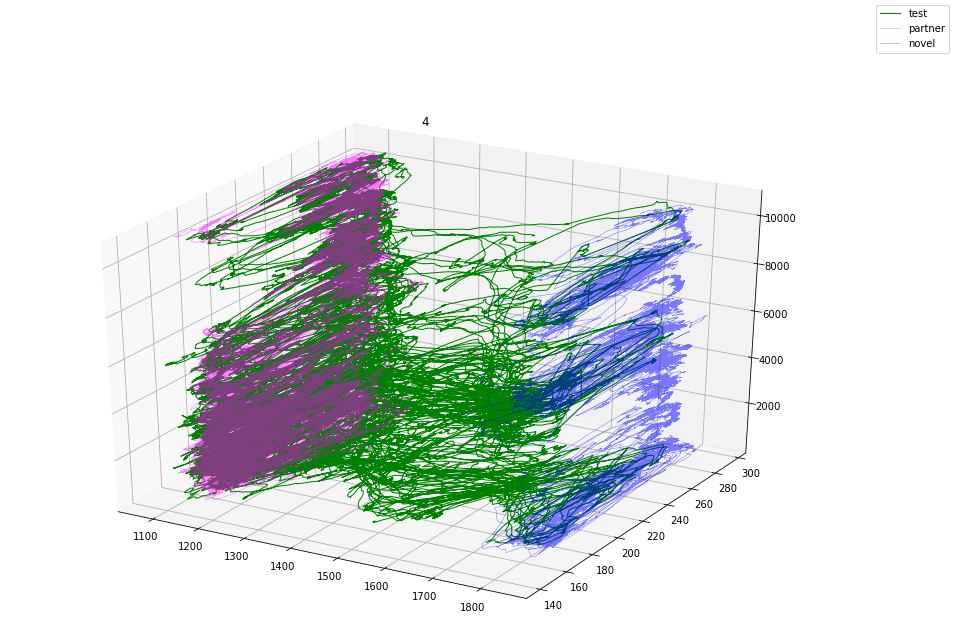

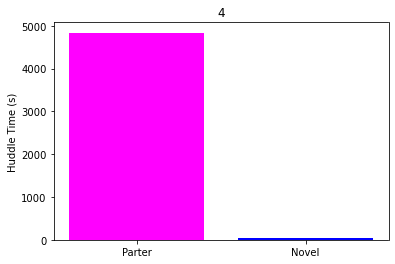

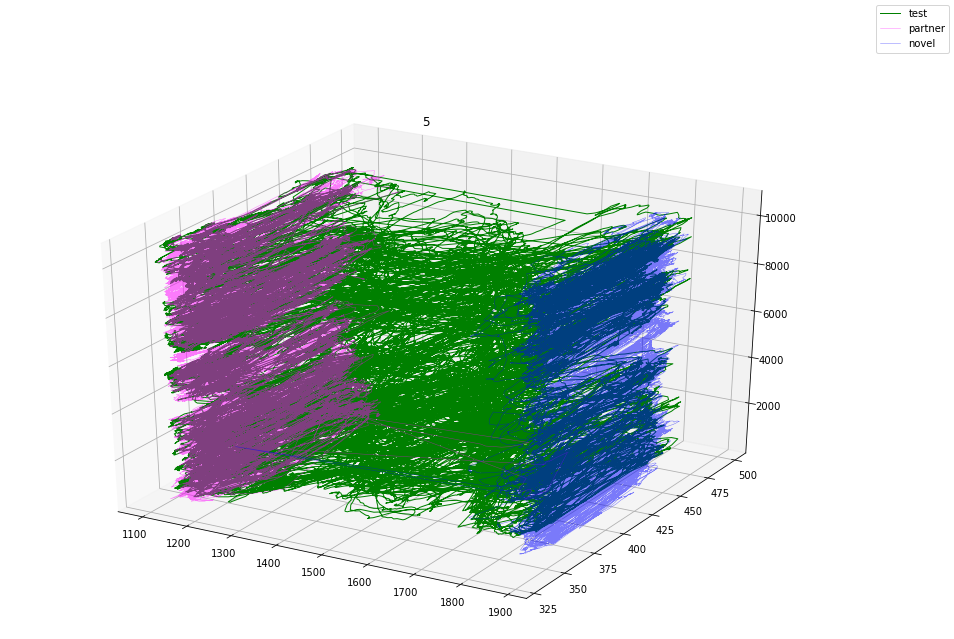

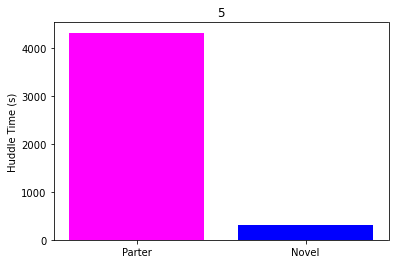

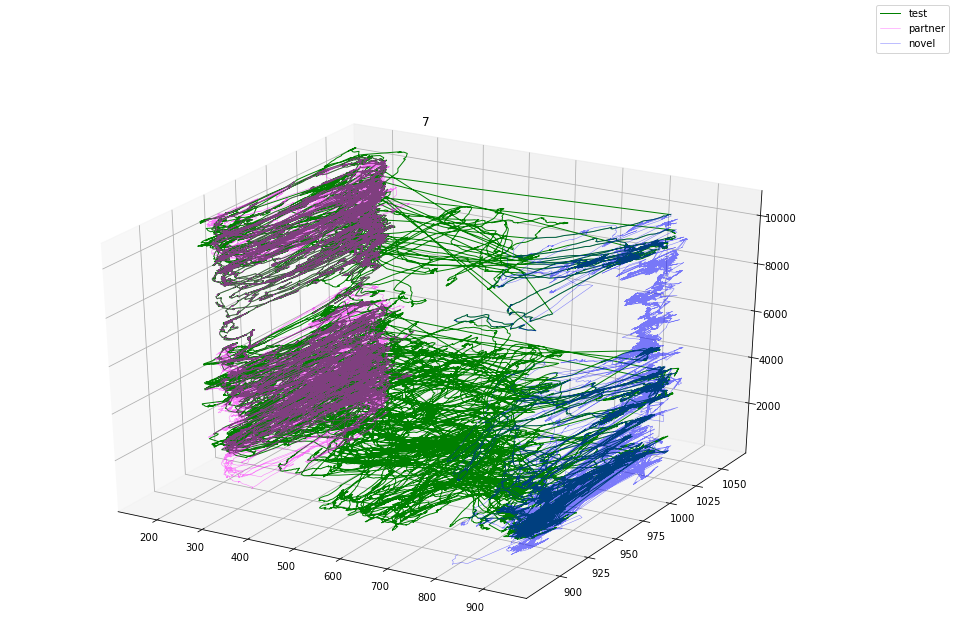

...

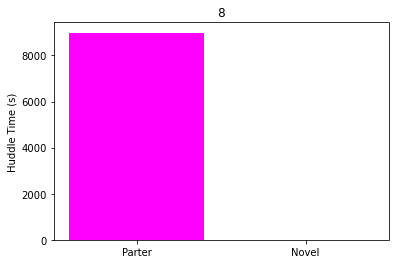

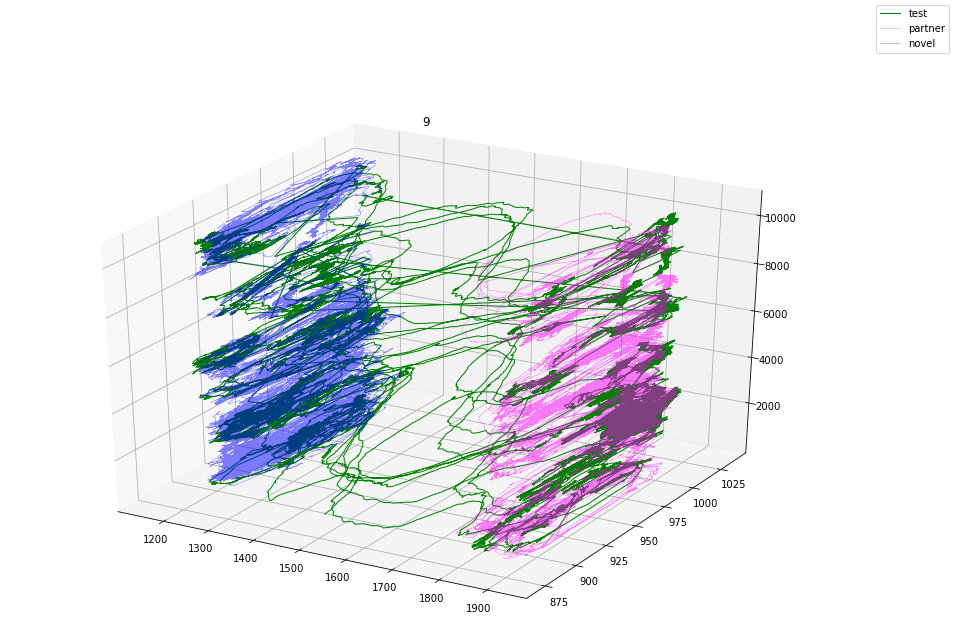

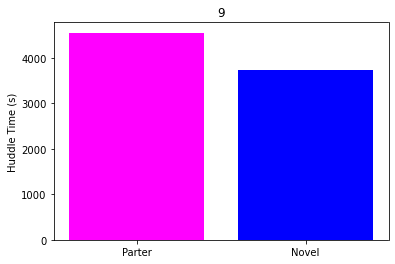

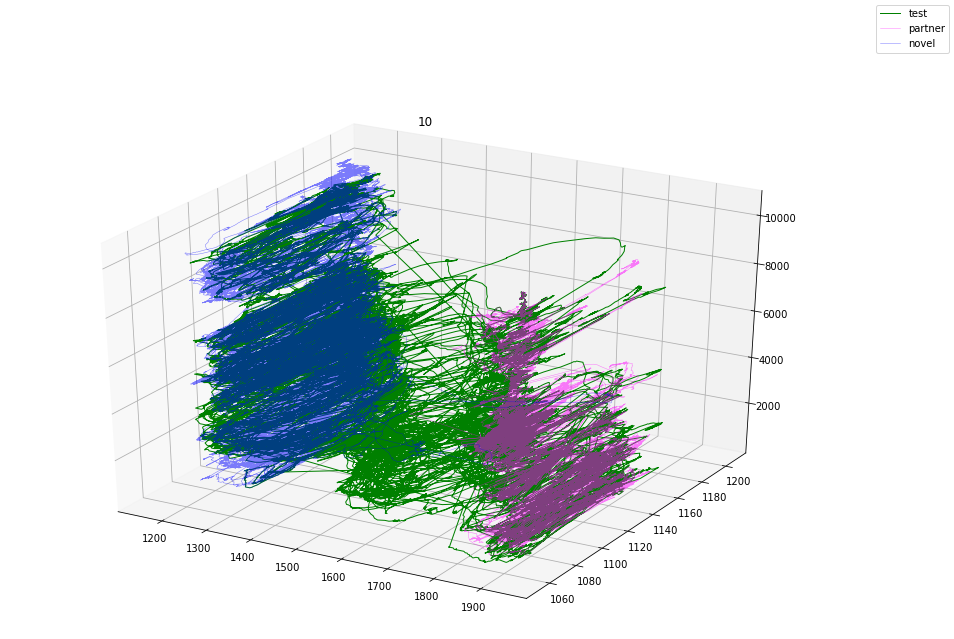

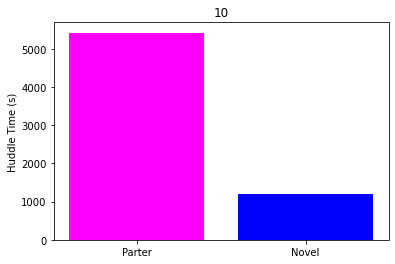

In [79]:
import platform
import pandas as pd
import Useful_Functions as uf
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import traceback
import time
import numpy as np
#David Protter
output_metrics_list=[]

#Directions for user: How many Days of testing? enter below

#Directions for user: On your computer or collie create a folder with cleversys output txt files for each day of testing
#Directions for user: add the paths for those folders below
directories=['C:/Users/kamu7656/Documents/TXT output files/Day 1','C:/Users/kamu7656/Documents/TXT output files/Day 2','C:/Users/kamu7656/Documents/TXT output files/Day 3']
#Directions for user: add a label for each timepoint
timelabels=['Baseline','Day 1','Day 5']
num_of_timepoints=len(timelabels)

for n in range(num_of_timepoints):

    '''Parse all files in a folder. Run standard set of analysis and ouput basic plots.
    Convert all parsed files to CSV to make it easier to work with them in the future.'''
    computer_platform = platform.system()
    if computer_platform in ['Darwin', 'Linux']:
        initialdir = '/'
    else:
        initialdir = ''

    from tkinter import messagebox, filedialog
    '''messagebox.showinfo('yo dawg', 'where the files at?!?!')
    start_dir = filedialog.askdirectory(initialdir = initialdir)

    choose_save_dir = messagebox.askquestion(message = 'Choose File Output Location? If "no", output will be placed in same folder as the input files', )
    if choose_save_dir == 'yes':
        save_dir = filedialog.askdirectory(initialdir = initialdir)
    else:
        save_dir = start_dir'''

    start_dir = directories[n]
    save_dir = directories[n]
    supress_csv = False

    #make a new savdir for plots only
    plot_out_path = os.path.join(save_dir, 'python_output')
    try:
        os.mkdir(plot_out_path)
    except:
        print('plot dir already exists')

    #make a new directory for csv files
    csv_out_path = os.path.join(save_dir, 'parsed_csv_files')
    try:
        os.mkdir(csv_out_path)
    except:
        print('csv dir already exists')

    #get file paths
    files = assemble_names(start_dir)
    num_files = len(files)

    output_metrics = pd.DataFrame()

    for i, file in enumerate(files):
        start_time = time.time()
        print(f'working on file {i+1} of {num_files}')
        print(file)
        try:
            df, ani, frame_rate, date = parse(file)
        except Exception:
            print('oh no, a wild exception appears!')
            print(traceback.format_exc())
            print('here is the offending file. Better double check it: ')
            print(file)

            continue
        print(f'it took {time.time() - start_time} sec to parse')
        time_2 = time.time()
        #save the DF as a CSV file for fast parsing later. Can easily open this CSV
        #in your favorite program/language for analysis.
        base_file_name = os.path.basename(file).split('.TXT')[0]+'_'+ani+'_'+'.csv'
        new_file_name = os.path.join(csv_out_path, base_file_name)
        if not supress_csv:
            df.to_csv(os.path.join(save_dir,new_file_name))
        print(f'it took {time.time() - time_2} sec to save to csv')
        #huddle time novel,  partner, and total
        hn, hp, htot = uf.huddle_time(df, frame_rate)

        #get treatment_group
        treatment_group = df['Treatment Group'].unique()[0]

        #calculate time in partner, novel, and center chambers
        partner_time, novel_time, center_time = uf.chamber_time(df, frame_rate)

        #normalized preference (--> pHuddle %)
        if htot >0:
            norm_pref = hp / (htot)
        else:
            norm_pref = np.nan

        #calculate average distance between test animal and other animals
        average_distance_novel = df['distance_to_novel'].mean()
        average_distance_partner = df['distance_to_partner'].mean()

        #calculate total locamotion
        total_distance_traveled = df['distance_traveled'].sum()

        animal_num = ani.replace("['", '').replace("']", '')
        this_metrics = pd.DataFrame(data = {'animal':[animal_num],
                                            'treatment':[treatment_group],
                                            'bin_number':0,
                                            'huddle_time_partner':[hp],
                                            'huddle_time_novel':[hn],
                                            'huddle_time_total':[htot],
                                            'percent_pHuddle':[norm_pref],
                                            'chamber_time_partner':[partner_time],
                                            'chamber_time_novel':[novel_time],
                                            'chamber_time_center':[center_time],
                                            'average_distance_to_novel':[average_distance_novel],
                                            'average_distance_to_partner':[average_distance_partner],
                                            'total_distance_traveled': [total_distance_traveled],
                                            })

        output_metrics = output_metrics.append(this_metrics)
        time_3d_fig = uf.make_3d_movement_plot(df)
        huddle_fig = uf.make_huddle_time_polt(hp, hn, animal_num)
        time_3d_fig.savefig(os.path.join(plot_out_path, f'{ani}_{date}_movement'))
        huddle_fig.savefig(os.path.join(plot_out_path, f'{ani}_{date}_huddle_time'))

    #kinda assuming they're all from the same date here
    output_metrics.to_csv(os.path.join(plot_out_path, f'output_metrics.csv'))
    output_metrics.insert(1, 'timepoint', timelabels[n], True)
    output_metrics_list.append(output_metrics)


allRuns = pd.concat(output_metrics_list, sort=False)
allRuns=allRuns.reset_index()
allRuns.rename(columns = {'index' : 'anything'}, inplace=True)
allRuns=allRuns.drop(['anything'], axis=1)
treatments = allRuns['treatment'].unique()
unique_animals = allRuns['animal'].unique()
num_of_treatments = len(treatments)
num_of_groups = num_of_treatments*num_of_timepoints

 1. c) Review the Panda dataframe

In [80]:
#Show all Runs
allRuns



,animal,timepoint,treatment,bin_number,huddle_time_partner,huddle_time_novel,huddle_time_total,percent_pHuddle,chamber_time_partner,chamber_time_novel,chamber_time_center,average_distance_to_novel,average_distance_to_partner,total_distance_traveled
0,4,Baseline,pCPA,0,4836.603270,39.539540,4876.142809,0.991891,902.302302,8973.873874,932.232232,569.870930,128.845304,388290.959818
1,5,Baseline,Veh,0,4320.954288,316.683350,4637.637638,0.931715,2303.536870,6891.024358,1770.770771,503.311769,217.845934,571566.614932
2,7,Baseline,pCPA,0,5974.841508,639.806473,6614.647981,0.903274,1455.722389,8174.507841,1486.486486,495.227780,137.861488,266994.024576
3,9,Baseline,Res,0,8016.182850,99.366033,8115.548882,0.987756,461.428095,9352.686019,1017.450784,604.975551,102.168231,325968.318788
4,10,Baseline,pCPA,0,978.611945,7813.880547,8792.492492,0.111301,9034.000667,1417.984651,351.017684,133.576913,586.098557,279084.950653
5,15,Baseline,Veh,0,6651.051051,78.411745,6729.462796,0.988348,701.368035,9478.278278,1425.325325,596.733230,125.168388,289030.892458
6,2,Baseline,pCPA,0,4730.397064,1347.681014,6078.078078,0.778272,2330.930931,7876.142809,777.477477,510.714945,194.272814,425091.289049
7,6,Baseline,Res,0,7289.856523,258.858859,7548.715382,0.965708,820.854188,9463.897231,620.920921,582.872503,90.168121,335700.562260
8,11,Baseline,Res,0,5244.544545,2956.056056,8200.600601,0.639532,3682.749416,6584.050717,542.409076,438.165841,271.246904,387727.523743
9,12,Baseline,Veh,0,7900.233567,80.080080,7980.313647,0.989965,213.713714,9876.643310,783.016350,616.951275,69.589098,361567.883252


1. d) Make any necessary edits (the most important columns are the treatment, timepoint and animal columns) and define some global variables

In [81]:
#Options for Editing the panda 
##edit a specific cell a specific cell
#allRuns['column name'][row number]='new value'

##edit a whole coloumn
#allRuns['column name']='new value' (that value will be set for every row)

##replace one value with a new one
#allRuns.replace(old, new) (all occurances of the old value will be updated to the new value)
allRuns

#Update your other global variables
treatments = allRuns['treatment'].unique()
unique_animals = allRuns['animal'].unique()
num_of_treatments = len(treatments)
num_of_groups = num_of_treatments*num_of_timepoints

   animal timepoint treatment  bin_number  huddle_time_partner  \
0       4  Baseline      pCPA           0          4836.603270   
1       5  Baseline       Veh           0          4320.954288   
2       7  Baseline      pCPA           0          5974.841508   
3       9  Baseline       Res           0          8016.182850   
4      10  Baseline      pCPA           0           978.611945   
5      15  Baseline       Veh           0          6651.051051   
6       2  Baseline      pCPA           0          4730.397064   
7       6  Baseline       Res           0          7289.856523   
8      11  Baseline       Res           0          5244.544545   
9      12  Baseline       Veh           0          7900.233567   
10      8  Baseline       Veh           0          1012.579246   
11     14  Baseline       Veh           0          6632.532533   
12     13  Baseline      pCPA           0          3986.619953   
13      1  Baseline       Res           0          3341.975309   
14      3 

2. a) Function to make a bar graphs with connected animals points between timepoints based on whatever measurement/column is passed into the function and saves it in output file in the last timepoint folder

In [82]:
from matplotlib.collections import LineCollection
import matplotlib.pyplot as plt
import numpy as np
def make_graph(data):
    w = 1.6    # bar width
    x = [i*2+1 for i in range(num_of_groups)] # x-coordinates of your bars
    y=[]
    ticklabel=[]
    colors=[]
    for i in range(num_of_treatments):
        thisday=allRuns[allRuns['treatment'] == treatments[i]]
        thiscolor=[0,0,0]
        if i<3:
            thiscolor[i]=1
        else:
            thiscolor[0]=1
            thiscolor[i%3]=1
        for j in range(num_of_timepoints):
            y.append(thisday[thisday['timepoint'] == timelabels[j]][data])
            ticklabel.append(treatments[i] + ' ' +timelabels[j])
            colors.append(tuple(thiscolor))
    fig, ax = plt.subplots()
    ax.bar(x, 
       height = [y[i].mean() for i in range(num_of_groups)],
       yerr=[np.std(yi) for yi in y],    # error bars
       capsize=12, # error bar cap width in points
       width=w,    # bar width
       tick_label=ticklabel,
       color=(0,0,0,0),  # face color transparent
       edgecolor=colors,
       #ecolor=colors,    # error bar colors; setting this raises an error for whatever reason.
       )
    ax.set_title(data)
    lines_list=[]
    for n in range(len(unique_animals)):
        temp_lines=[]
        counter=0
        for i in range(num_of_treatments):
            thistreatment=allRuns[allRuns['treatment'] == treatments[i]]
            for j in range(num_of_timepoints):
                thisday_thistreatment = thistreatment[thistreatment['timepoint'] == timelabels[j]]
                if len(thisday_thistreatment[thisday_thistreatment.animal == unique_animals[n]])>0:
                    xvalue=x[counter]
                    yvalue=thisday_thistreatment[thisday_thistreatment.animal == unique_animals[n]][data].values[0]
                    temp_lines.append((xvalue, yvalue))
                counter=counter+1
            lines_list.append(temp_lines)
    lc = LineCollection(lines_list)
    ax.add_collection(lc)
    fig.savefig(os.path.join(plot_out_path, data))
    for i in range(len(x)):
        # distribute scatter randomly across whole width of bar
        ax.scatter(x[i] + np.random.random(y[i].size) * 0, y[i], color=colors[i])
    plt.show
    return 

2. b) Function that runs repeated Measures ANOVA across timepoints on a measurement/column for all treatments

In [83]:
def repeated_measures_ANOVA_across_timepoints(data):
    from statsmodels.stats.anova import AnovaRM
    from statsmodels.graphics.factorplots import interaction_plot
    trimmedRuns=allRuns.drop_duplicates(subset=['animal', 'timepoint'], keep='first')
    #has an issue if 2 animals were run the same day
    #has an issue if an animal isnt in all conditions
    fewest_animals=len(unique_animals)
    keep_animals=unique_animals
    for i in range(num_of_timepoints):
        temp=allRuns[allRuns['timepoint'] == timelabels[i]]['animal'].unique()
        if len(temp)<fewest_animals:
            keep_animals=temp
            fewest_animals=len(temp)
            day_with_fewest=i+1
    trimmedRuns['keep'] = trimmedRuns.animal.isin(keep_animals).astype(int)
    trimmedRuns=trimmedRuns[trimmedRuns['keep']==1]

    for i in range(num_of_treatments):
        aovrm = AnovaRM(trimmedRuns[trimmedRuns['treatment']==treatments[i]], data, 'animal', within=['timepoint'])
        repeatedmeasures=aovrm.fit()
        print(data + ' for ' + treatments[i])
        print(repeatedmeasures)
    return()

2. c) Function that runs a oneway ANOVA on independent across treatments on a measurement/column for all timepoints

In [84]:
def independent_measures_ANOVA_between_treatments(data):
    import statsmodels.api as sm
    from statsmodels.formula.api import ols
    for n in range(num_of_timepoints):
        formula= data + ' ~ treatment'
        mod=ols(formula, data=allRuns[allRuns['timepoint']==timelabels[n]]).fit()
        anova= sm.stats.anova_lm(mod, typ=2)
        print(data + ' for timepoint ' + str(n+1))
        print(anova)
        print()
    return()

2. d) Function that runs a two way ANOVA for treatments and timepoints on a measurement/column

In [85]:
def two_way_ANOVA_treatments_and_timepoints(data):
    import statsmodels.api as sm
    from statsmodels.formula.api import ols
    formula= data + ' ~ treatment + timepoint + treatment:timepoint'
    mod=ols(formula, data=allRuns).fit()
    anova= sm.stats.anova_lm(mod, typ=2)
    print(data)
    print(anova)
    print()
    return()

3. a) Runs make graph on all animals

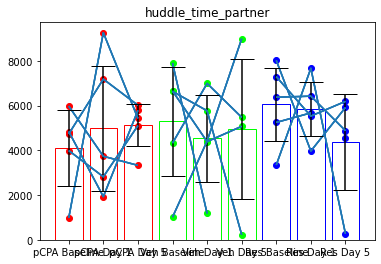

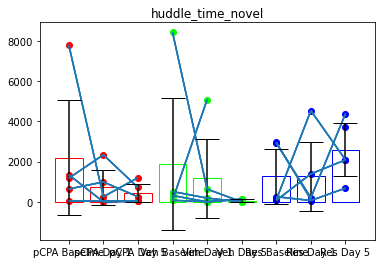

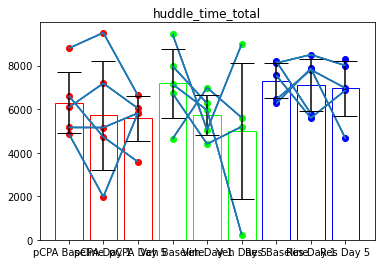

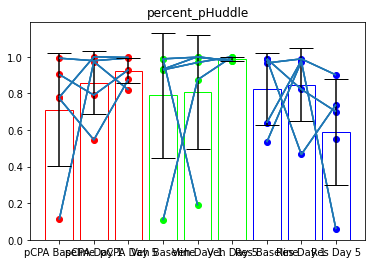

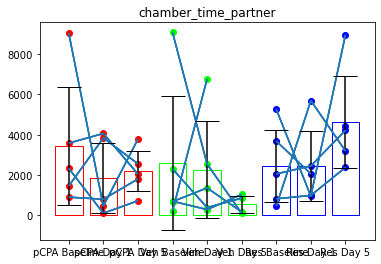

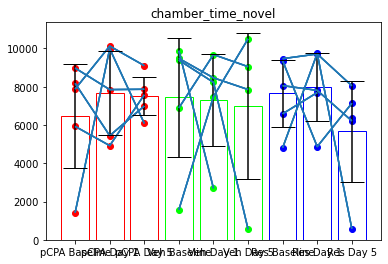

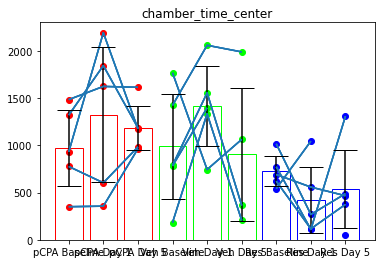

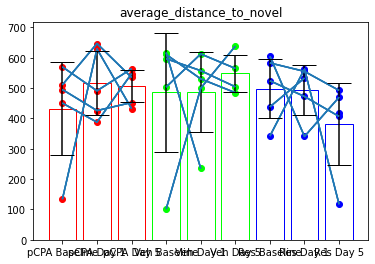

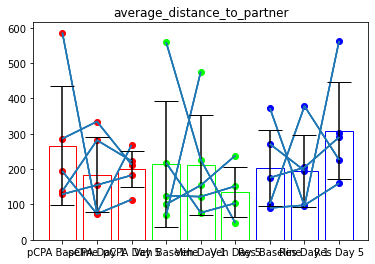

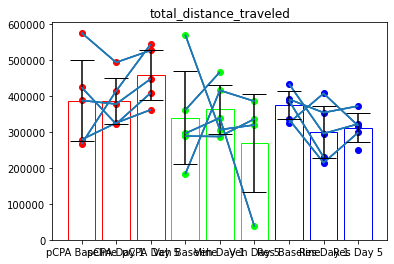

In [86]:
# creating a list of dataframe columns 
columns = list(allRuns) 
types=allRuns.dtypes 
j=0
for i in columns:
    if types[j] == 'float64':
        make_graph(i)
    j=j+1


3. b) Run repeated measures Anova across timepoints for each column 

In [87]:
# creating a list of dataframe columns 
columns = list(allRuns) 
types=allRuns.dtypes 
j=0
if num_of_timepoints>1:
    for i in columns:
        if types[j] == 'float64':
            repeated_measures_ANOVA_across_timepoints(i)
        j=j+1
else:
    print('you need at least two timepoints to run this')

<ipython-input-83-f02782d78670>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trimmedRuns['keep'] = trimmedRuns.animal.isin(keep_animals).astype(int)


huddle_time_partner for pCPA
                Anova
          F Value Num DF Den DF Pr > F
--------------------------------------
timepoint  0.2527 2.0000 8.0000 0.7827

huddle_time_partner for Veh
                Anova
          F Value Num DF Den DF Pr > F
--------------------------------------
timepoint  0.0535 2.0000 6.0000 0.9483

huddle_time_partner for Res
                Anova
          F Value Num DF Den DF Pr > F
--------------------------------------
timepoint  0.8449 2.0000 6.0000 0.4750

huddle_time_novel for pCPA
                Anova
          F Value Num DF Den DF Pr > F
--------------------------------------
timepoint  1.2769 2.0000 8.0000 0.3301

huddle_time_novel for Veh
                Anova
          F Value Num DF Den DF Pr > F
--------------------------------------
timepoint  1.2361 2.0000 6.0000 0.3552

huddle_time_novel for Res
                Anova
          F Value Num DF Den DF Pr > F
--------------------------------------
timepoint  0.7736 2.0000 6.0000 0.50

3. c) Run independent group one-way ANOVA across treatment groups for each timepoint and each column/measurement

In [88]:
# creating a list of dataframe columns 
columns = list(allRuns) 
types=allRuns.dtypes 
j=0
if num_of_treatments>1:
    for i in columns:
        if types[j] == 'float64':
            independent_measures_ANOVA_between_treatments(i)
        j=j+1
else:
    print('You need at least two treatments to run this stat')

huddle_time_partner for timepoint 1
                 sum_sq    df         F    PR(>F)
treatment  9.688574e+06   2.0  1.012718  0.392274
Residual   5.740143e+07  12.0       NaN       NaN

huddle_time_partner for timepoint 2
                 sum_sq    df         F    PR(>F)
treatment  4.403258e+06   2.0  0.407862  0.673951
Residual   6.477565e+07  12.0       NaN       NaN

huddle_time_partner for timepoint 3
                 sum_sq    df         F    PR(>F)
treatment  1.590683e+06   2.0  0.132204  0.877534
Residual   6.617629e+07  11.0       NaN       NaN

huddle_time_novel for timepoint 1
                 sum_sq    df         F    PR(>F)
treatment  2.290700e+06   2.0  0.132765  0.876939
Residual   1.035224e+08  12.0       NaN       NaN

huddle_time_novel for timepoint 2
                 sum_sq    df         F    PR(>F)
treatment  8.405982e+05   2.0  0.133607  0.876217
Residual   3.774947e+07  12.0       NaN       NaN

huddle_time_novel for timepoint 3
                 sum_sq    df      

3. d) Run 2 way repeated measures ANOVA for treatment groups and timepoints

In [89]:
# creating a list of dataframe columns 
columns = list(allRuns) 
types=allRuns.dtypes 
j=0
if num_of_treatments>1 and num_of_timepoints>1:
    for i in columns:
        if types[j] == 'float64':
            two_way_ANOVA_treatments_and_timepoints(i)
        j=j+1
else:
    print('you need at least two timepoints AND two treatments to run this')

huddle_time_partner
                           sum_sq    df         F    PR(>F)
treatment            3.761236e+06   2.0  0.349458  0.707502
timepoint            1.150750e+06   2.0  0.106917  0.898893
treatment:timepoint  1.192128e+07   4.0  0.553806  0.697538
Residual             1.883534e+08  35.0       NaN       NaN

huddle_time_novel
                           sum_sq    df         F    PR(>F)
treatment            3.491378e+06   2.0  0.404741  0.670232
timepoint            4.980928e+06   2.0  0.577418  0.566603
treatment:timepoint  1.720910e+07   4.0  0.997489  0.421940
Residual             1.509587e+08  35.0       NaN       NaN

huddle_time_total
                           sum_sq    df         F    PR(>F)
treatment            1.421190e+07   2.0  2.052530  0.143587
timepoint            8.602503e+06   2.0  1.242402  0.301109
treatment:timepoint  4.573802e+06   4.0  0.330282  0.855714
Residual             1.211715e+08  35.0       NaN       NaN

percent_pHuddle
                       su